In [2]:
import pandas as pd
from geopy import Point
from geopy.distance import distance
import seaborn as sns



In [3]:
cities_df = pd.read_csv("cities.csv")
stations_df = pd.read_csv("stations.csv")
providers_df = pd.read_csv("providers.csv")
tickets_df = pd.read_csv("ticket_data.csv")

In [4]:
tickets_df['o_station'] = tickets_df['o_station'].astype(pd.Int64Dtype())
tickets_df['d_station'] = tickets_df['d_station'].astype(pd.Int64Dtype())
tickets_df.arrival_ts=pd.to_datetime(tickets_df.arrival_ts)
tickets_df.departure_ts=pd.to_datetime(tickets_df.departure_ts)
tickets_df

,id,company,o_station,d_station,departure_ts,arrival_ts,price_in_cents,search_ts,middle_stations,other_companies,o_city,d_city
0,6795025,8385,<NA>,<NA>,2017-10-13 14:00:00+00:00,2017-10-13 20:10:00+00:00,4550,2017-10-01 00:13:31.327+00,NaN,NaN,611,542
1,6795026,9,63,1044,2017-10-13 13:05:00+00:00,2017-10-14 06:55:00+00:00,1450,2017-10-01 00:13:35.773+00,"{149,418}",{13},611,542
2,6795027,8377,5905,6495,2017-10-13 13:27:00+00:00,2017-10-14 21:24:00+00:00,7400,2017-10-01 00:13:40.212+00,"{798,798,6794,6246}","{8377,8376}",611,542
3,6795028,8377,5905,6495,2017-10-13 13:27:00+00:00,2017-10-14 11:02:00+00:00,13500,2017-10-01 00:13:40.213+00,"{798,798,6794,6246}","{8377,8376}",611,542
4,6795029,8381,5905,6495,2017-10-13 21:46:00+00:00,2017-10-14 19:32:00+00:00,7710,2017-10-01 00:13:40.213+00,"{5983,5983}",{8380},611,542
...,...,...,...,...,...,...,...,...,...,...,...,...
74163,6869182,13,279,10729,2017-10-27 02:30:00+00:00,2017-10-27 16:00:00+00:00,2590,2017-10-19 10:35:42.943+00,"{408,408}",{8371},628,562
74164,6869185,9,279,304,2017-10-27 07:00:00+00:00,2017-10-27 13:30:00+00:00,2700,2017-10-19 10:35:42.943+00,"{1105,1105}",{9},628,562
74165,6869187,8371,10642,304,2017-10-27 08:30:00+00:00,2017-10-27 15:15:00+00:00,3000,2017-10-19 10:35:42.943+00,"{1105,1105}",{9},628,562
74166,6869189,13,279,304,2017-10-27 13:25:00+00:00,2017-10-27 21:10:00+00:00,2880,2017-10-19 10:35:42.943+00,"{863,863}",{13},628,562


In [5]:
stations_df

,id,unique_name,latitude,longitude
0,1,Aalen (Stuttgarter Straße),48.835296,10.092956
1,2,Aéroport Bordeaux-Mérignac,44.830226,-0.700883
2,3,Aéroport CDG,49.009900,2.559310
3,4,Aéroport de Berlin-Schönefeld,52.389446,13.520345
4,5,Aéroport de Dresden,51.123604,13.764737
...,...,...,...,...
11030,11032,Porto Avda De Los Aliados,41.146922,-8.611122
11031,11033,Rom Ciampino Flughafen Piazzale Leonardo da Vinci,41.804102,12.597110
11032,11034,Sants,41.379892,2.139462
11033,11035,Vozilici D66,45.157136,14.164140


In [6]:
cities_df

,id,local_name,unique_name,latitude,longitude,population
0,5159,"Padua, Veneto, Italia",padua,45.406435,11.876761,209678.0
1,76,"Barcelona, Cataluña, España",barcelona,41.385064,2.173404,1611822.0
2,81,"Basel, Basel-Stadt, Schweiz",basel,47.593437,7.619812,NaN
3,259,"Erlangen, Bayern, Deutschland",erlangen,49.589674,11.011961,105412.0
4,11979,"Balș, Olt, România",balș,44.353354,24.095672,NaN
...,...,...,...,...,...,...
8035,9964,"Saint-André-lez-Lille, Hauts-de-France, France",saint-andre-lez-lille,50.654250,3.047690,NaN
8036,10863,"Kiev, Шевченківський район, Ukraine",kiev,50.450100,30.523400,NaN
8037,11144,"Brighton, England, UK",brighton,50.822000,-0.137400,NaN
8038,11377,"Manises, Comunitat Valenciana, España",manises,39.493000,-0.462100,NaN


In [7]:
providers_df

,id,company_id,provider_id,name,fullname,has_wifi,has_plug,has_adjustable_seats,has_bicycle,transport_type
0,9,1,NaN,ouibus,Ouibus,True,True,True,False,bus
1,10,2,NaN,deinbus,Deinbus.de,False,False,False,False,bus
2,11,3,NaN,infobus,Infobus,False,False,False,False,bus
3,12,4,NaN,studentAgency,Student Agency,False,False,False,False,bus
4,13,5,NaN,flixbus,Flixbus,True,False,False,False,bus
...,...,...,...,...,...,...,...,...,...,...
222,8384,10,16,thalys,Thalys,True,True,False,True,train
223,8385,11,NaN,bbc,Blablacar,False,False,False,False,carpooling
224,8387,30,NaN,vatry,Vatry,NaN,NaN,NaN,NaN,bus
225,8388,40,NaN,beauval,Beauval,NaN,NaN,NaN,NaN,bus


investigate NA stations, carpool??

In [8]:
ticket_with_station = tickets_df[tickets_df.o_station.notna()].merge(stations_df[['latitude', 'longitude','id']].rename(columns={'id':'id_'}), left_on='o_station', right_on='id_').drop(columns=['id_']).rename(columns={'latitude':'o_latitude','longitude':'o_longitude'})
ticket_with_station = ticket_with_station.merge(stations_df[['latitude', 'longitude','id']].rename(columns={'id':'id_'}), left_on='d_city', right_on='id_').drop(columns=['id_']).rename(columns={'latitude':'d_latitude','longitude':'d_longitude'})

In [9]:
ticket_with_city = tickets_df[tickets_df.o_station.notna()==False].merge(cities_df[['latitude', 'longitude','id']].rename(columns={'id':'id_'}), left_on='o_city', right_on='id_').drop(columns=['id_']).rename(columns={'latitude':'o_latitude','longitude':'o_longitude'})
ticket_with_city = ticket_with_city.merge(cities_df[['latitude', 'longitude','id']].rename(columns={'id':'id_'}), left_on='d_city', right_on='id_').drop(columns=['id_']).rename(columns={'latitude':'d_latitude','longitude':'d_longitude'})

In [10]:
tickets_df = pd.concat([ticket_with_city, ticket_with_station])

tickets_df['o_coordinates'] = tickets_df.apply(lambda row: Point(latitude=row['o_latitude'], longitude=row['o_longitude']), axis=1)
tickets_df['d_coordinates'] = tickets_df.apply(lambda row: Point(latitude=row['d_latitude'], longitude=row['d_longitude']), axis=1)
tickets_df = tickets_df.drop(columns={'o_latitude','o_longitude','d_latitude','d_longitude'})

tickets_df['distance'] = tickets_df.apply(lambda row: distance(row['o_coordinates'], row['d_coordinates']).km, axis=1)


<AxesSubplot:xlabel='distance', ylabel='distance'>

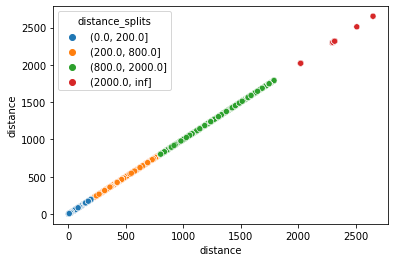

In [11]:
tickets_df['distance_splits'] = pd.cut(tickets_df.distance, [0,200,800, 2000, float("inf")])
sns.scatterplot(data=tickets_df, x="distance", y="distance", hue="distance_splits")

In [17]:
tickets_df['duration'] =tickets_df.arrival_ts-tickets_df.departure_ts
